In [1]:
from google.colab import drive

In [2]:
drive.mount('/content/drive')

Mounted at /content/drive


In [180]:
!pip install ydata_profiling

In [181]:
from ydata_profiling import ProfileReport
#Import all relevant libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import zscore
import plotly.express as px

## This statement allows the visuals to render within your Jupyter Notebook.
%matplotlib inline

In [487]:
df = pd.read_csv("/content/drive/MyDrive/Unsuervised-project/teamwork/Data/GoldenTechnology.xls")

In [242]:
profile=ProfileReport(df,title='laptops')
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

##Relevance:

In [488]:
df.drop(columns=['Warranty Period','Microsoft Office','Mobile broadband','User Guide','Accessories','Part Number','Color','keyboard language','Lighting keyboard'],inplace=True)

##Uniqueness

In [489]:
df.duplicated().sum()

18

In [490]:
df.drop_duplicates(inplace=True)

##Completeness

In [491]:

df.isnull().sum()

,0
Product Price,0
Product Type,0
Model Number,0
Processor Type,0
Processor Speed,8
RAM,0
Storage Capacity,0
Graphics Card,0
Screen Size,0
Display Resolution,0


In [492]:
null_counts = df.isnull().sum()

In [493]:
columns_to_drop = null_counts[null_counts >= 190].index

In [494]:
df_cleaned = df.drop(columns=columns_to_drop)

In [495]:
df_cleaned.isnull().sum()

,0
Product Price,0
Product Type,0
Model Number,0
Processor Type,0
Processor Speed,8
RAM,0
Storage Capacity,0
Graphics Card,0
Screen Size,0
Display Resolution,0


In [496]:
df_cleaned['Network and Communication']=df_cleaned['Network and Communication'].fillna('Wi-Fi + Bluetooth')
df_cleaned['Speakers Type']=df_cleaned['Speakers Type'].fillna('Built-in Speakers')
df_cleaned['Ethernet Port']=df_cleaned['Ethernet Port'].fillna('Unknown')
df_cleaned['Display Type']=df_cleaned['Display Type'].fillna('Unknown')
df_cleaned['Ports']=df_cleaned['Ports'].fillna('Unknown')
df_cleaned['Front Camera']=df_cleaned['Front Camera'].fillna('Yes')

In [497]:
df_cleaned.loc[df_cleaned['Processor Type'] == 'Intel Core i7-13700H (13th Gen)', 'Processor Speed'] = '2.4 GHz'
df_cleaned.loc[df_cleaned['Processor Type'] == 'Intel Core Ultra 7-150U', 'Processor Speed'] = '2.4 GHz'
df_cleaned.loc[(df_cleaned['Processor Type'] == 'Intel Core i7-13700H (13th Gen)') & (df_cleaned['Processor Speed'].isna()), 'Processor Speed'] = '2.4 GHz'
df_cleaned.loc[(df_cleaned['Processor Type'] == 'Intel Core Ultra 7-150U') & (df_cleaned['Processor Speed'].isna()), 'Processor Speed'] = '2.4 GHz'
df_cleaned.loc[(df_cleaned['Processor Type'] == 'Intel Core Ultra 5-125U') & (df_cleaned['Processor Speed'].isna()), 'Processor Speed'] = '1.3 GHz'
df_cleaned.loc[(df_cleaned['Processor Type'] == 'AMD Ryzen 7-5800H') & (df_cleaned['Processor Speed'].isna()), 'Processor Speed'] = '3.2 GHz'
df_cleaned.loc[(df_cleaned['Processor Type'] == 'Microsoft SQ 3 Neural Processing Unit (NPU)') & (df_cleaned['Processor Speed'].isna()), 'Processor Speed'] = '3.0 GHz'
df_cleaned.loc[(df_cleaned['Processor Type'] == 'Intel Core Ultra 7-155H') & (df_cleaned['Processor Speed'].isna()), 'Processor Speed'] = '1.4 GHz'
df_cleaned.loc[(df_cleaned['Processor Type'] == 'Intel Core i3-N300') & (df_cleaned['Processor Speed'].isna()), 'Processor Speed'] = '1.8 GHz'

In [498]:
profile=ProfileReport(df_cleaned,title='laptops')
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Accuracy check

In [499]:
df_cleaned.dtypes

,0
Product Price,object
Product Type,object
Model Number,object
Processor Type,object
Processor Speed,object
RAM,object
Storage Capacity,object
Graphics Card,object
Screen Size,object
Display Resolution,object


In [500]:
df_cleaned['Product Price'] = df_cleaned['Product Price'].str.replace(' SR', '').str.replace(',', '').astype(float)

In [501]:
df_cleaned['Processor Speed'] = df_cleaned.apply(
    lambda row: '3.2 GHz' if row['Processor Type'] in ['Apple M1 chip', 'Apple M2 chip'] and row['Processor Speed'] == '8-Core CPU' else
                ('3.4 GHz' if row['Processor Type'] == 'Apple M3 chip' and row['Processor Speed'] == '8-Core CPU' else row['Processor Speed']),
    axis=1
)
df_cleaned['Processor Speed'] = df_cleaned['Processor Speed'].replace('14-core CPU', '3.4 GHz')
df_cleaned['Processor Speed'] = df_cleaned['Processor Speed'].replace('12-core CPU', '3.5 GHz')
df_cleaned['Processor Speed'] = df_cleaned['Processor Speed'].replace('16-core CPU', '3.6 GHz')
df_cleaned['Processor Speed'] = df_cleaned['Processor Speed'].replace('11-core CPU', '3.3 GHz')
df_cleaned['Processor Speed'] = df_cleaned['Processor Speed'].str.replace('GHz', '').astype(float)

In [502]:
import re


In [503]:
# Function to extract size and type
def extract_ram_info(ram):
    size_match = re.search(r'(\d+GB|\d+MB)', ram)
    type_match = re.search(r'(DDR\d+|LPDDR\d+|SO-DIMM|Soldered|Ram)', ram)

    size = size_match.group(0) if size_match else None
    ram_type = type_match.group(0) if type_match else None

    return pd.Series([size, ram_type])

In [504]:
# Apply the function to split RAM into size and type
df_cleaned[['RAM Size', 'RAM Type']] = df_cleaned['RAM'].apply(extract_ram_info)

In [505]:
df_cleaned['RAM Type'] = df_cleaned['RAM Type'].fillna('Ram')

In [506]:
df_cleaned['RAM Size'] = df_cleaned['RAM Size'].str.replace('GB', '').astype(int)


In [507]:
print(df_cleaned['RAM Type'].unique())

['LPDDR5' 'DDR4' 'Ram' 'DDR5' 'SO-DIMM' 'Soldered' 'LPDDR4']


In [508]:
unique_values = df_cleaned['Screen Size'].unique()

print(unique_values)

['13 inch' '15.6 inch' '15.3 inch' '16 inch' '13.5 inch' '14.2 inch'
 '14 inch' '14.4 inch' '16.2 inch' '16.1 inch' '13.6 inch' '8.8 inch'
 '17.3 inch' '14.5 inch' '13.3 inch' '10.5" inch']


In [509]:
df_cleaned['Storage Capacity'] = df_cleaned['Storage Capacity'].replace('2x 1TB SSD M.2', '2TB SSD M.2 + SSD M.2')


In [510]:
# Use str.extract to split into Size and Type columns
df_cleaned[['Storage Value', 'Storage Type']] = df_cleaned['Storage Capacity'].str.extract(r'(\d+\s?[A-Za-z]+)\s*(.*)')



In [511]:
# Function to convert TB to GB
def convert_tb_to_gb(value):
    if 'TB' in value:
        # Extract the number part before 'TB', convert to float, and multiply by 1024 to convert to GB
        number = float(value.split(' ')[0].replace('TB', '').strip())
        return f"{number * 1024}GB"
    return value

# Apply the function to the 'Storage Value' column
df_cleaned['Storage Value'] = df_cleaned['Storage Value'].apply(convert_tb_to_gb)

In [512]:
print(df_cleaned['Storage Value'].unique())

['512GB' '256GB' '1024.0GB' '2048.0GB' '128GB' '64GB']


In [513]:
df_cleaned['Storage Value'] = df_cleaned['Storage Value'].str.replace('GB', '').astype(float)

In [514]:
df_cleaned['Screen Size'] = df_cleaned['Screen Size'].str.replace(r'[^\d.]', '', regex=True).astype(float)

In [515]:
df_cleaned.dtypes

,0
Product Price,float64
Product Type,object
Model Number,object
Processor Type,object
Processor Speed,float64
RAM,object
Storage Capacity,object
Graphics Card,object
Screen Size,float64
Display Resolution,object


In [516]:
unique_values = df_cleaned['Display Resolution'].unique()

print(unique_values)

['2880X1920 (267 PPI)' '1920x1080' 'Liquid Retina 2880x1864'
 '2560 x1600 QHD' 'WUXGA+ 1920x1280, IPS' '3024x1964'
 '1920 x 1080 FHD IPS' '1920x1200' '2560x1600 WQXGA' '4480x2520'
 '2400×1600' '3456x2234' 'Liquid Retina 2560x1664' '3200x2000'
 '3840X2160 4k OLED' '1920x1200 Full HD' 'WUXGA 1920x1200 IPS'
 '1366 x 768 HD' '3840 x 2400 WQUXGA' '2880x1620' '2560 x1440 QHD'
 '2256 x 1504 PPI' '2560x1080' '3072x1920' '3K (3072x1440)'
 '2880x1800 OLED 400nits Glossy IPS' '2880x1920'
 'Retina Display 2560x1600' '1920 x 1280 (220 PPI)']


In [517]:

# Function to clean and split display resolutions
def extract_dimensions(resolution):
    # Remove extra spaces and standardize the format
    resolution = resolution.replace(' ', '')  # Remove all spaces
    resolution = resolution.replace('×', 'x')  # Replace multiplication sign with 'x'

    # Use regex to extract width and height
    match = re.search(r'(\d+)[xX](\d+)', resolution)
    if match:
        width = match.group(1)
        height = match.group(2)
        return pd.Series([width, height])
    else:
        return pd.Series([None, None])  # Return None if no match found

# Apply the function to extract width and height
df_cleaned[['Width', 'Height']] = df_cleaned['Display Resolution'].apply(extract_dimensions)


In [518]:
df_cleaned.dtypes

,0
Product Price,float64
Product Type,object
Model Number,object
Processor Type,object
Processor Speed,float64
RAM,object
Storage Capacity,object
Graphics Card,object
Screen Size,float64
Display Resolution,object


In [519]:
df_cleaned['Width']=df_cleaned['Width'].astype(int)

In [520]:
df_cleaned['Height']=df_cleaned['Width'].astype(int)

In [521]:
profile=ProfileReport(df_cleaned,title='laptops')
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

#Feature selection

In [277]:
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV
from sklearn import metrics

from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.preprocessing import LabelEncoder
from sklearn import metrics
import warnings
warnings.filterwarnings("ignore")

In [278]:
df_cleaned.dtypes

,0
Product Price,float64
Product Type,object
Model Number,object
Processor Type,object
Processor Speed,float64
RAM,object
Storage Capacity,object
Graphics Card,object
Screen Size,float64
Display Resolution,object


In [524]:
label_encoder = LabelEncoder()
df_cleaned['Processor_Type_encoded'] = label_encoder.fit_transform(df_cleaned['Processor Type'])
df_cleaned['Graphics_Card_encoded'] = label_encoder.fit_transform(df_cleaned['Graphics Card'])
df_cleaned['Operating_System_encoded'] = label_encoder.fit_transform(df_cleaned['Operating System'])
df_cleaned['Brand_encoded'] = label_encoder.fit_transform(df_cleaned['Brand'])
df_cleaned['RAM_Type_encoded'] = label_encoder.fit_transform(df_cleaned['RAM Type'])
df_cleaned['Storage_Type_encoded'] = label_encoder.fit_transform(df_cleaned['Storage Type'])

In [569]:
df_cleaned['Battery_Type_encoded'] = label_encoder.fit_transform(df_cleaned['Battery Type'])

In [761]:
df_model = df_cleaned[['Processor_Type_encoded',
              'Processor Speed',
               'RAM Size',
              'RAM_Type_encoded',
              'Storage_Type_encoded',
              'Storage Value',
              'Screen Size',
              # 'Graphics_Card_encoded',
                      'Width','Height',

              # 'Battery_Type_encoded',
              ]]




In [762]:
# Prepare data
X = df_model


# sacle the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [763]:

X.shape

(297, 9)

## Buliding the Model

In [764]:
wcss = []
for i in range(1, 20):
    kmeans = KMeans(n_clusters=i,
                    init='k-means++',
                    max_iter=300,
                    n_init=10,
                    random_state=0)
    kmeans.fit(X_scaled)
    wcss.append(kmeans.inertia_)


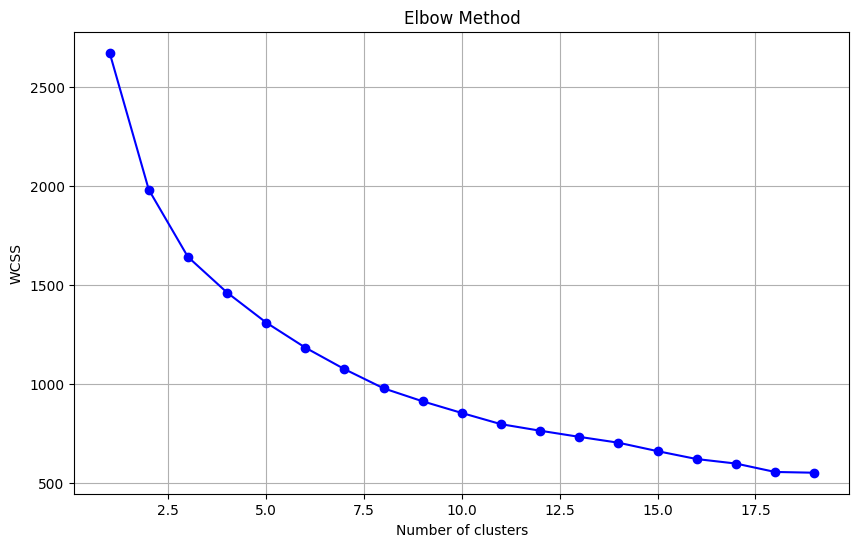

In [765]:
# 3. Plot the Elbow Curve
plt.figure(figsize=(10, 6))
plt.plot(range(1, 20), wcss,  marker='o', linestyle='-', color='b')
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.grid(True)
plt.show()

In [766]:
# Optional: Apply k-Means using the optimal number of clusters
optimal_clusters = 3
model = KMeans(n_clusters=optimal_clusters, init='k-means++', max_iter=300, n_init=10, random_state=0)

train

In [767]:

y_pred = model.fit_predict(X_scaled)

Evaluation:

In [768]:


X['kmeans'] = y_pred

In [769]:

X['kmeans'].value_counts()

,count
kmeans,
2,217
0,42
1,38


In [770]:
X[X['kmeans']==0].describe().T

,count,mean,std,min,25%,50%,75%,max
Processor_Type_encoded,42.0,21.476190,11.284001,0.0,16.00,18.00,19.000,62.0
Processor Speed,42.0,3.000000,0.738819,1.2,3.20,3.25,3.400,3.6
RAM Size,42.0,15.476190,9.607513,8.0,8.00,16.00,16.000,48.0
RAM_Type_encoded,42.0,3.928571,0.894232,2.0,4.00,4.00,4.000,6.0
Storage_Type_encoded,42.0,2.214286,0.415300,2.0,2.00,2.00,2.000,3.0
Storage Value,42.0,527.238095,304.747781,128.0,256.00,512.00,512.000,1024.0
Screen Size,42.0,13.940476,1.588074,8.8,13.35,13.60,14.425,16.2
Width,42.0,2967.619048,496.512567,2256.0,2560.00,2880.00,3060.000,4480.0
Height,42.0,2967.619048,496.512567,2256.0,2560.00,2880.00,3060.000,4480.0
kmeans,42.0,0.000000,0.000000,0.0,0.00,0.00,0.000,0.0


In [771]:
X[X['kmeans']==1].describe().T

,count,mean,std,min,25%,50%,75%,max
Processor_Type_encoded,38.0,54.868421,5.527186,47.0,50.000,54.00,60.0,66.0
Processor Speed,38.0,2.057895,0.490246,1.5,1.625,2.05,2.3,3.4
RAM Size,38.0,27.578947,9.610331,16.0,16.000,32.00,32.0,64.0
RAM_Type_encoded,38.0,3.921053,2.018584,0.0,2.250,5.00,5.0,6.0
Storage_Type_encoded,38.0,3.236842,0.942516,2.0,3.000,3.00,3.0,7.0
Storage Value,38.0,1091.368421,360.490388,512.0,1024.000,1024.00,1024.0,2048.0
Screen Size,38.0,15.460526,0.930428,13.3,15.600,16.00,16.0,17.3
Width,38.0,2384.000000,474.388824,1920.0,1920.000,2560.00,2560.0,3840.0
Height,38.0,2384.000000,474.388824,1920.0,1920.000,2560.00,2560.0,3840.0
kmeans,38.0,1.000000,0.000000,1.0,1.000,1.00,1.0,1.0


In [772]:
X[X['kmeans']==2].describe().T

,count,mean,std,min,25%,50%,75%,max
Processor_Type_encoded,217.0,36.405530,13.359404,1.0,32.0,37.0,48.0,63.0
Processor Speed,217.0,1.902765,0.715044,0.9,1.3,1.7,2.4,4.0
RAM Size,217.0,10.857143,4.407785,4.0,8.0,8.0,16.0,16.0
RAM_Type_encoded,217.0,0.898618,1.784410,0.0,0.0,0.0,1.0,6.0
Storage_Type_encoded,217.0,3.023041,0.604324,0.0,3.0,3.0,3.0,8.0
Storage Value,217.0,516.423963,189.412848,64.0,512.0,512.0,512.0,1024.0
Screen Size,217.0,15.247005,0.860933,10.5,14.4,15.6,15.6,17.3
Width,217.0,1905.133641,132.005281,1366.0,1920.0,1920.0,1920.0,2560.0
Height,217.0,1905.133641,132.005281,1366.0,1920.0,1920.0,1920.0,2560.0
kmeans,217.0,2.000000,0.000000,2.0,2.0,2.0,2.0,2.0


In [720]:
profile=ProfileReport(X,title='laptops')
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

KeyboardInterrupt: 

<Figure size 800x550 with 0 Axes>

In [628]:
from sklearn.metrics import silhouette_score


In [773]:
silhouette_avg = silhouette_score(X, y_pred)
silhouette_avg

0.597409021675325